# UKESM QA/QC

The CEDA version of UKESM historical UKESM1-0-LL is the wrong simulation, which shows up as a
discontinuity at the 2015 historical/SSP245 junction
([issue #529](https://github.com/carbonplan/srm-downscaling/issues/529), and again at a single
pixel in [issue #635](https://github.com/carbonplan/srm-downscaling/issues/635)). This notebook
checks the UKESM1-1-LL run provided by Matthew Henry (suite `u-by791`, 1850-2014). Loosely based
off of `docs/explanation/qa-qc/input-data-global-timeseries.ipynb`.


In [1]:
import os

os.environ["FRISKY_SUMMARY"] = "off"
os.environ["FRISKY_DEATH_DUMP_DIR"] = ""

import textwrap

import coiled
import frisky
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr
import zarr
from IPython.display import display

from saidownscale.config import ClusterConfig
from saidownscale.datasets import catalog
from saidownscale.input_data.etl_utils import _init_repo_from_uri
from saidownscale.input_data.ukesm import BUCKET, UNIFIED_PREFIX
from saidownscale.plotting import locations

zarr.config.set({"async.concurrency": 128})
VARIABLES = ["tas", "tasmax", "tasmin", "pr", "rsds"]
UNITS = {
    "tas": "K",
    "tasmax": "K",
    "tasmin": "K",
    "pr": "kg m-2 s-1",
    "rsds": "W m-2",
}
SPATIAL = ["lat", "lon"]
# The pre-#652 CEDA UKESM1-0-LL historical, kept only as an icechunk snapshot: the raw
# NetCDFs were removed from s3://carbonplan-srm/input/raw/UKESM/netcdf/historical when the
# u-by791 delivery replaced them, and the live `historical` group is now the new run.
OLD_HIST_SNAPSHOT = "QMCS7711FRQJJWYWHE3G"

STORE_GROUPS = {
    "historical": "UKESM1-1-LL historical",
    "ssp245": "ssp245",
    "g6_1p5k": "g6_1p5k",
}

SURFACE = "#fcfcfb"
STYLE = {
    "UKESM1-1-LL historical": {"color": "#2a78d6", "linestyle": "-"},
    "UKESM1-0-LL historical": {"color": "#8a8a86", "linestyle": (0, (5, 2))},
    "ssp245": {"color": "#eb6834", "linestyle": "-"},
    "g6_1p5k": {"color": "#1baf7a", "linestyle": "-"},
}
INK = "#52514e"

[21:13:59] WARNING  Redefining 'percent' (<class 'pint.delegates.txt_defparser.plain.UnitDefinition'>)

           WARNING  Redefining '%' (<class 'pint.delegates.txt_defparser.plain.UnitDefinition'>)

           WARNING  Redefining 'year' (<class 'pint.delegates.txt_defparser.plain.UnitDefinition'>)

           WARNING  Redefining 'yr' (<class 'pint.delegates.txt_defparser.plain.UnitDefinition'>)

           WARNING  Redefining 'C' (<class 'pint.delegates.txt_defparser.plain.UnitDefinition'>)

           WARNING  Redefining 'd' (<class 'pint.delegates.txt_defparser.plain.UnitDefinition'>)

           WARNING  Redefining 'h' (<class 'pint.delegates.txt_defparser.plain.UnitDefinition'>)

           WARNING  Redefining 'degrees_north' (<class 'pint.delegates.txt_defparser.plain.UnitDefinition'>)

           WARNING  Redefining 'degrees_east' (<class 'pint.delegates.txt_defparser.plain.UnitDefinition'>)

           WARNING  Redefining 'degrees' (<class 'pint.delegates.txt_defparser.plain.UnitDefinition'>)

           WARNING  Redefining '[speed]' (<class 'pint.delegates.txt_defparser.plain.DerivedDimensionDefinition'>)

           INFO     Choice not found. Ignoring: malformed node or string on line 1: <ast.Name object at            
                    0x128ee45d0>

           INFO     Choice not found. Ignoring: malformed node or string on line 1: <ast.Name object at            
                    0x128ee9ad0>

           INFO     Choice not found. Ignoring: malformed node or string on line 1: <ast.Name object at            
                    0x128ef87d0>

           INFO     Choice not found. Ignoring: malformed node or string on line 1: <ast.Name object at            
                    0x128ef85d0>

           INFO     Choice not found. Ignoring: malformed node or string on line 1: <ast.Name object at            
                    0x128f135d0>

           INFO     Choice not found. Ignoring: malformed node or string on line 1: <ast.Name object at            
                    0x128f13550>

           INFO     Choice not found. Ignoring: malformed node or string on line 1: <ast.Name object at            
                    0x128f13a10>

           INFO     Choice not found. Ignoring: malformed node or string on line 1: <ast.Name object at            
                    0x128efa910>

           INFO     Choice not found. Ignoring: malformed node or string on line 1: <ast.Name object at            
                    0x128ef9b10>

           INFO     Choice not found. Ignoring: malformed node or string on line 1: <ast.Name object at            
                    0x128f27110>

           INFO     Choice not found. Ignoring: malformed node or string on line 1: <ast.Name object at            
                    0x128f4f890>

           INFO     Choice not found. Ignoring: malformed node or string on line 1: <ast.Name object at            
                    0x128f4ed50>

           INFO     Choice not found. Ignoring: malformed node or string on line 1: <ast.Name object at            
                    0x128f59910>

           INFO     Choice not found. Ignoring: malformed node or string on line 1: <ast.Name object at            
                    0x128fc7610>

           INFO     Choice not found. Ignoring: malformed node or string on line 1: <ast.Name object at            
                    0x128fd3250>

           INFO     Choice not found. Ignoring: malformed node or string on line 1: <ast.Name object at            
                    0x128fd3950>

           INFO     Choice not found. Ignoring: malformed node or string on line 1: <ast.Name object at            
                    0x128fed510>

           INFO     Choice not found. Ignoring: malformed node or string on line 1: <ast.Name object at            
                    0x128ffced0>

           INFO     Choice not found. Ignoring: malformed node or string on line 1: <ast.Name object at            
                    0x128ffd2d0>

In [2]:
# client = frisky.hijack(Client())
# client

# Roughly 360 GB of reads, an order of magnitude less than the plausible-value check, so a smaller
# pool suffices. The reduction is a per-timestep sum over lat/lon, so intermediates stay tiny and
# the run is read-bound rather than memory-bound.

# Use a FIXED pool, not an adaptive one. Each group reduces in one long pass, so a worker that
# vanishes mid-run discards reduction partials that frisky surfaces as an unrecoverable "missing
# dependencies" invariant violation rather than recomputing. A fixed worker count removes adaptive
# downscaling, which is one of the two ways a worker vanishes; uncomment spot_policy="on-demand"
# to remove the other. This run kept the ClusterConfig default, spot_with_fallback, and lost no
# workers.
cfg = ClusterConfig(
    n_workers=20,
    worker_vm_types=["r8g.4xlarge"],
    scheduler_vm_types=["r8g.xlarge"],
    # spot_policy="on-demand",
)
cluster = coiled.Cluster(
    name="ukesm-qa-qc",
    region=cfg.region,
    n_workers=cfg.n_workers,
    worker_vm_types=cfg.worker_vm_types,
    scheduler_vm_types=cfg.scheduler_vm_types,
    spot_policy=cfg.spot_policy,
    use_best_zone=True,
    tags=cfg.tags,
)
client = frisky.hijack(cluster.get_client())
client

[21:14:01] INFO     Fetching latest package priorities...

           INFO     Resolving your local /Users/nrhagen/Documents/carbonplan/SRM/uv.lock Python environment...

           INFO     Scanning 320 python packages...

           INFO     Running pip check...

[21:14:02] INFO     Validating environment...

[21:14:03] INFO     Creating wheel for ~/Documents/carbonplan/SRM/src...

           INFO     Creating wheel for saidownscale...

[21:14:06] INFO     Creating wheel for srm...

[21:14:08] INFO     Uploading coiled_local_src...

[21:14:09] INFO     Uploading saidownscale...

[21:14:11] INFO     Uploading srm...

[21:14:12] INFO     Creating software environment...

[21:14:13] INFO     Creating Cluster (name: ukesm-qa-qc, https://cloud.coiled.io/clusters/2003650 ). This usually  
                    takes 1-2 minutes...

<frisky.Client: scheduler="wss://cluster-xgdhk.dask.host/qkblkxfjyyTCqGBi/frisky-comm?__frisky_dial_host=35.92.96.93" id="client-0">

In [3]:
def open_old_hist() -> xr.Dataset:
    """The superseded CEDA UKESM1-0-LL historical, read from a pinned icechunk snapshot."""
    repo, _ = _init_repo_from_uri(f"s3://{BUCKET}/{UNIFIED_PREFIX}")
    session = repo.readonly_session(snapshot_id=OLD_HIST_SNAPSHOT)
    return xr.open_zarr(session.store, group="historical", consolidated=False, chunks="auto")


runs = {"UKESM1-0-LL historical": open_old_hist()}
if STORE_GROUPS:
    tree = catalog.get("UKESM").to_xarray()
    for group, label in STORE_GROUPS.items():
        runs[label] = tree[group].to_dataset()

for label, ds in runs.items():
    missing = [v for v in VARIABLES if v not in ds.data_vars]
    assert not missing, (label, missing)

{label: dict(ds.sizes) for label, ds in runs.items()}

{'UKESM1-0-LL historical': {'ensemble_member': 3,
  'time': 60265,
  'lat': 144,
  'lon': 192},
 'UKESM1-1-LL historical': {'ensemble_member': 1,
  'time': 60265,
  'lat': 144,
  'lon': 192},
 'ssp245': {'ensemble_member': 3, 'time': 31046, 'lat': 144, 'lon': 192},
 'g6_1p5k': {'ensemble_member': 3, 'time': 18263, 'lat': 144, 'lon': 192}}

In [4]:
# Calendar was converted 360_day -> proleptic_gregorian at write time.
assert runs["UKESM1-1-LL historical"].sizes["time"] == 60265
runs["UKESM1-1-LL historical"].time

<xarray.DataArray 'time' (time: 60265)> Size: 482kB
array(['1850-01-01T12:00:00.000000000', '1850-01-02T12:00:00.000000000',
       '1850-01-03T12:00:00.000000000', ..., '2014-12-29T12:00:00.000000000',
       '2014-12-30T12:00:00.000000000', '2014-12-31T12:00:00.000000000'],
      shape=(60265,), dtype='datetime64[ns]')
Coordinates:
  * time     (time) datetime64[ns] 482kB 1850-01-01T12:00:00 ... 2014-12-31T1...

## 1. Global mean timeseries alongside SSP
"plot timeseries of global mean alongside ssp"

In [5]:
def global_annual_mean(ds: xr.Dataset, var: str) -> xr.DataArray:
    """Area-weighted global mean, averaged over the days of each year.

    An ``ensemble_member`` dimension is carried through if the run has one.
    """
    da = ds[var]
    w = np.cos(np.deg2rad(ds.lat)).astype("float32")
    valid = (da.notnull() * w).sum(SPATIAL)
    daily = (da.fillna(0) * w).sum(SPATIAL) / valid.where(valid > 0)
    return daily.groupby("time.year").mean()


def plot_series(
    ax: plt.Axes, series: xr.DataArray, label: str, lw: float = 1.8, label_it: bool = True
) -> None:
    """One heavy line per run, with thin member lines beneath it where members exist."""
    style = STYLE[label]
    if "ensemble_member" in series.dims:
        for member in series.ensemble_member.values:
            ax.plot(series.year, series.sel(ensemble_member=member), lw=0.9, alpha=0.5, **style)
        series = series.mean("ensemble_member")
    ax.plot(series.year, series, lw=lw, label=label if label_it else None, **style)


annual = {
    var: {label: global_annual_mean(ds, var).compute() for label, ds in runs.items()}
    for var in VARIABLES
}

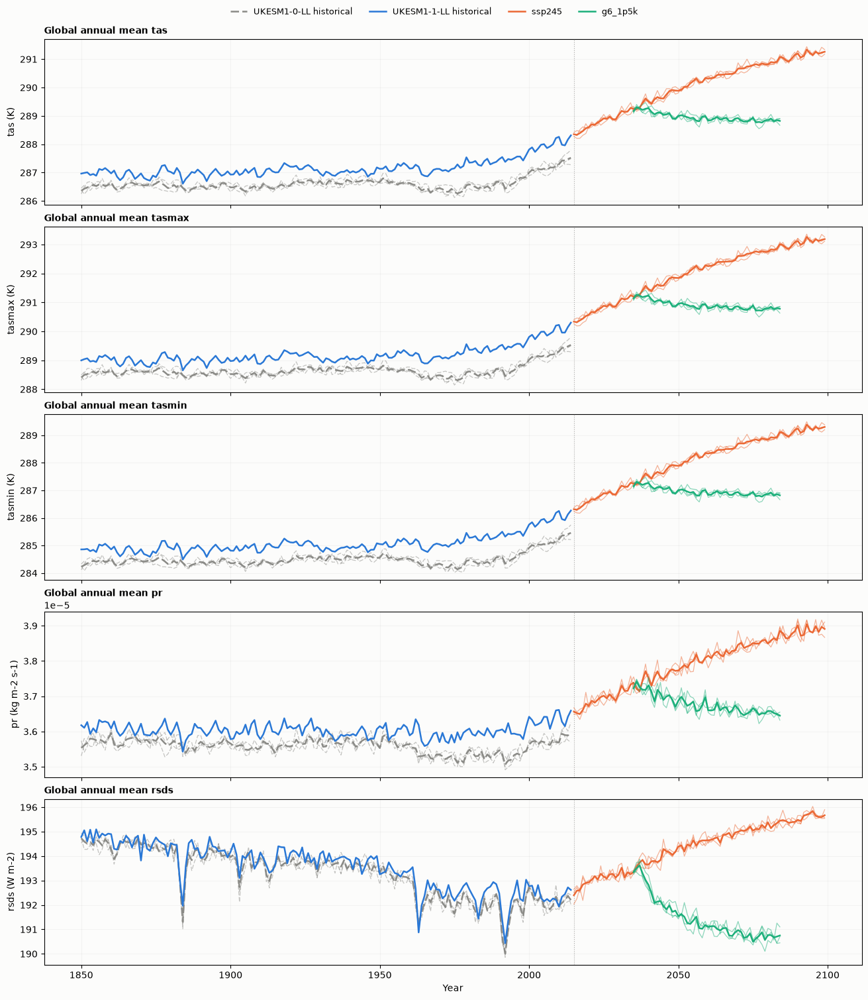

In [6]:
fig, axes = plt.subplots(
    len(VARIABLES),
    1,
    figsize=(13, 3.0 * len(VARIABLES)),
    sharex=True,
    constrained_layout=True,
    squeeze=False,
)
fig.patch.set_facecolor(SURFACE)
axes = axes.ravel()

for ax, var in zip(axes, VARIABLES):
    ax.set_facecolor(SURFACE)
    for label, series in annual[var].items():
        plot_series(ax, series, label)
    ax.axvline(2015, color=INK, lw=0.8, ls=":", alpha=0.5, zorder=0)
    ax.set_ylabel(f"{var} ({UNITS[var]})")
    ax.grid(alpha=0.18, lw=0.5)
    ax.set_title(f"Global annual mean {var}", loc="left", fontweight="bold", fontsize=10)

axes[-1].set_xlabel("Year")
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(
    handles, labels, frameon=False, ncols=len(labels), loc="outside upper center", fontsize=9
)

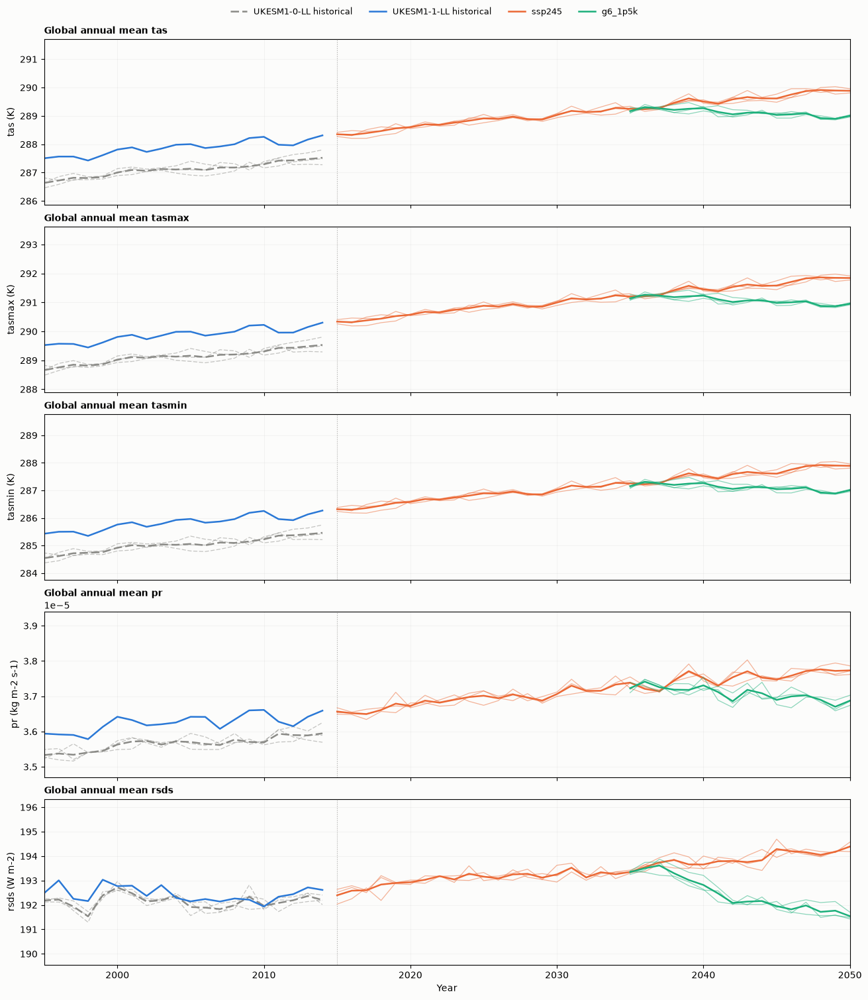

In [7]:
axes[0].set_xlim(1995, 2050)
fig

## 2. Pixel timeseries alongside SSP
"plot timeseries of a handful of pixels (esp. the one that claire flagged in her issue) alongside ssp"


In [8]:
PIXELS = {
    "kalahari (flagged)": (-22.0, 20.0),
    "cairo": locations["Cairo"],
    "lagos": locations["Lagos"],
    "equatorial pacific": (0.0, -140.0),
}


def pixel_series(ds: xr.Dataset, lat: float, lon: float) -> dict[str, xr.DataArray]:
    """Annual mean of each variable at the nearest grid cell."""
    cell = ds.sel(lat=lat, lon=lon, method="nearest")
    return {v: cell[v].groupby("time.year").mean().compute() for v in VARIABLES}


pixels = {
    label: {name: pixel_series(ds, lat, lon) for name, (lat, lon) in PIXELS.items()}
    for label, ds in runs.items()
}

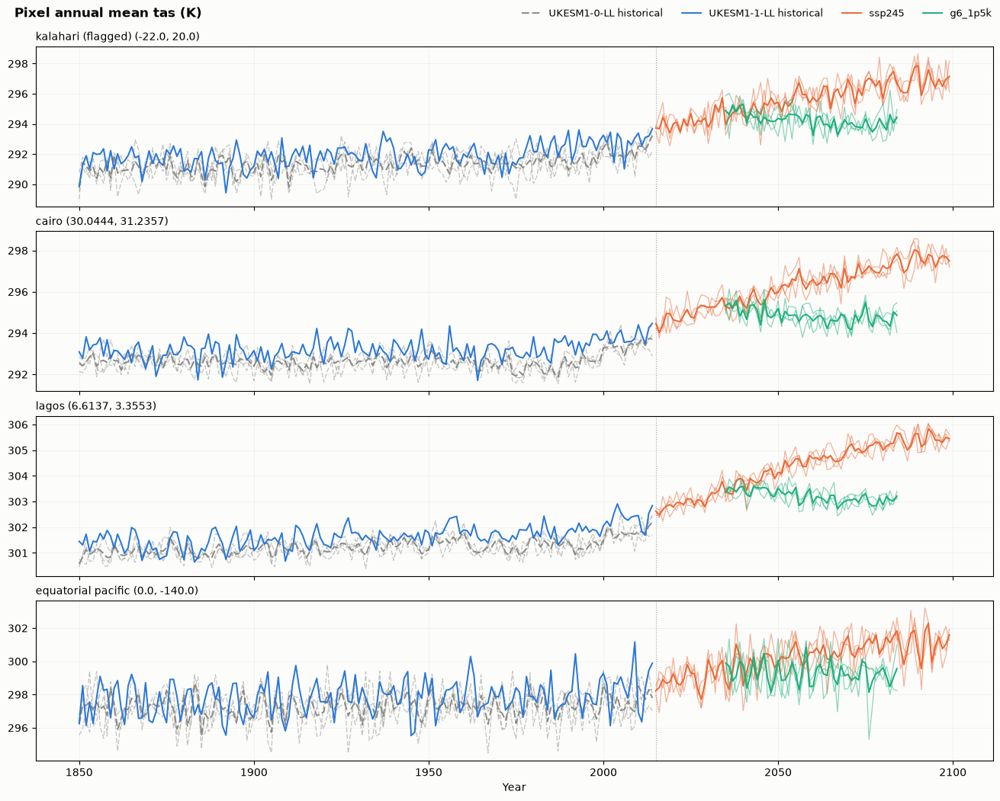

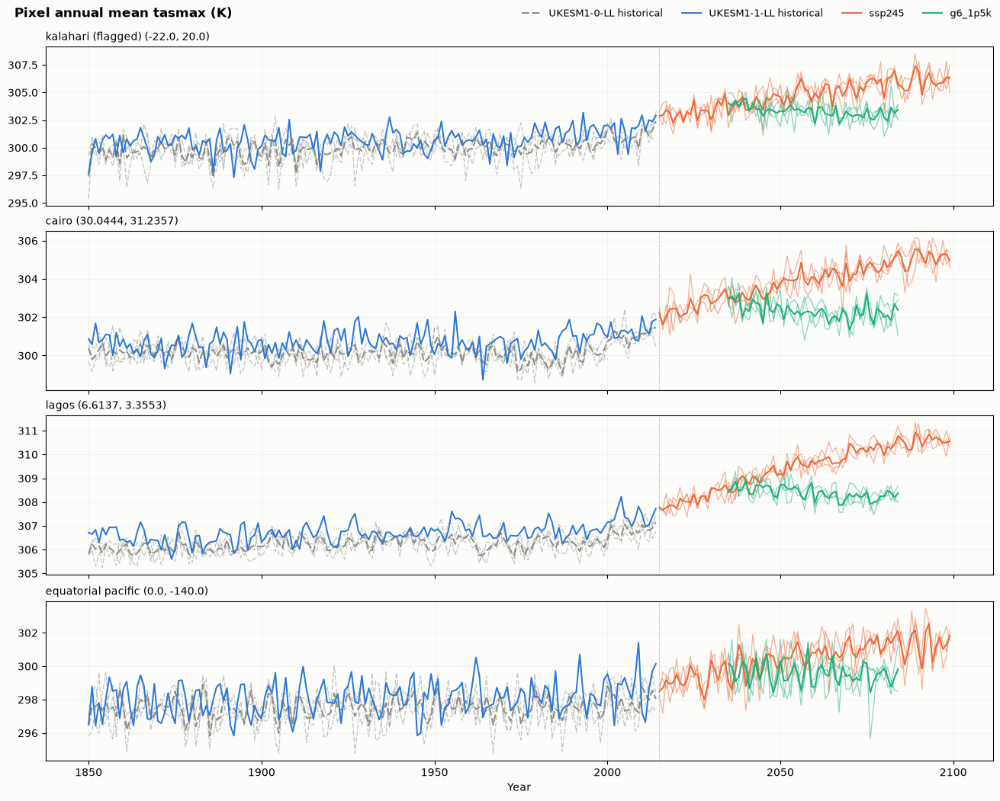

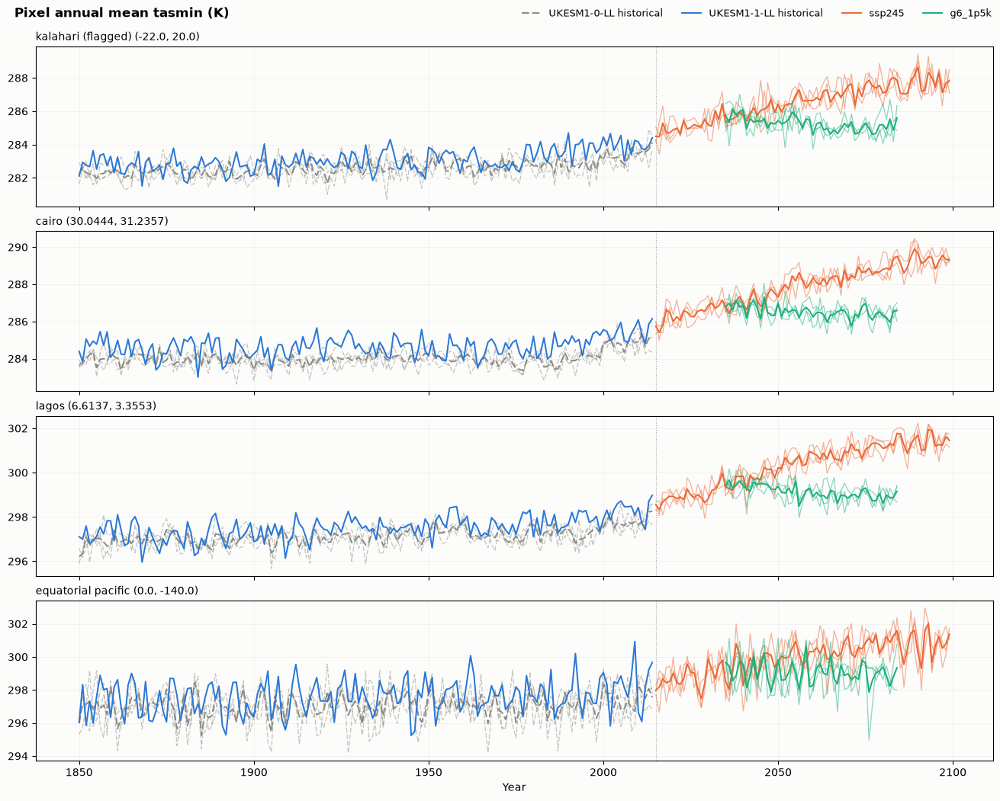

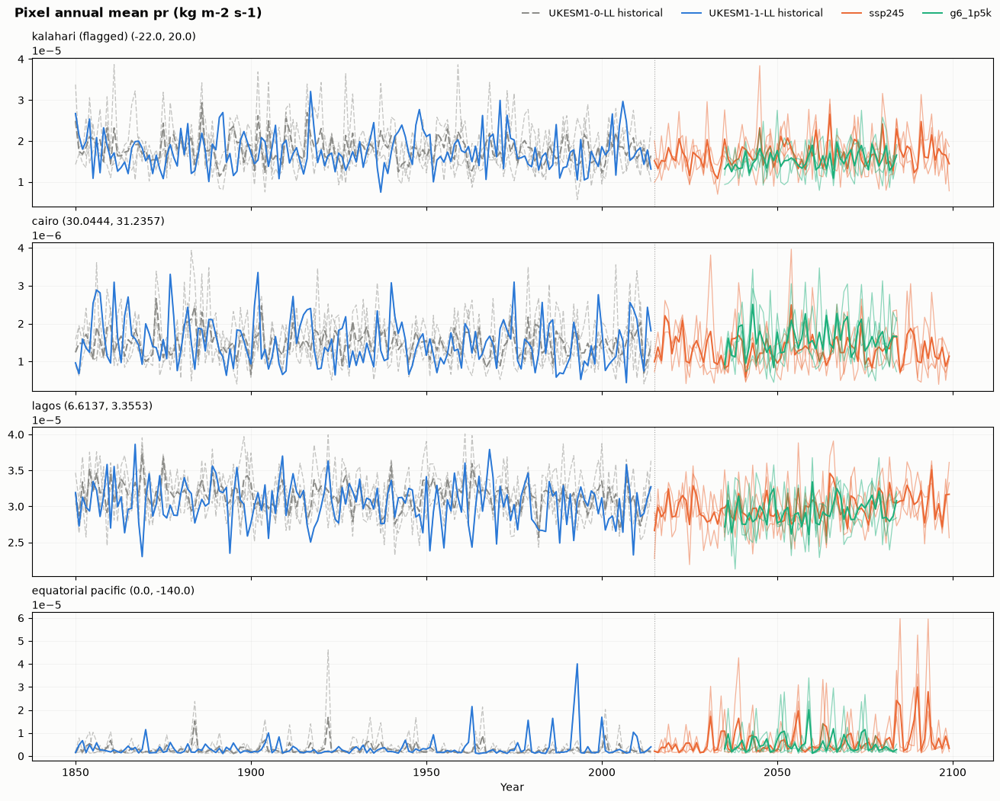

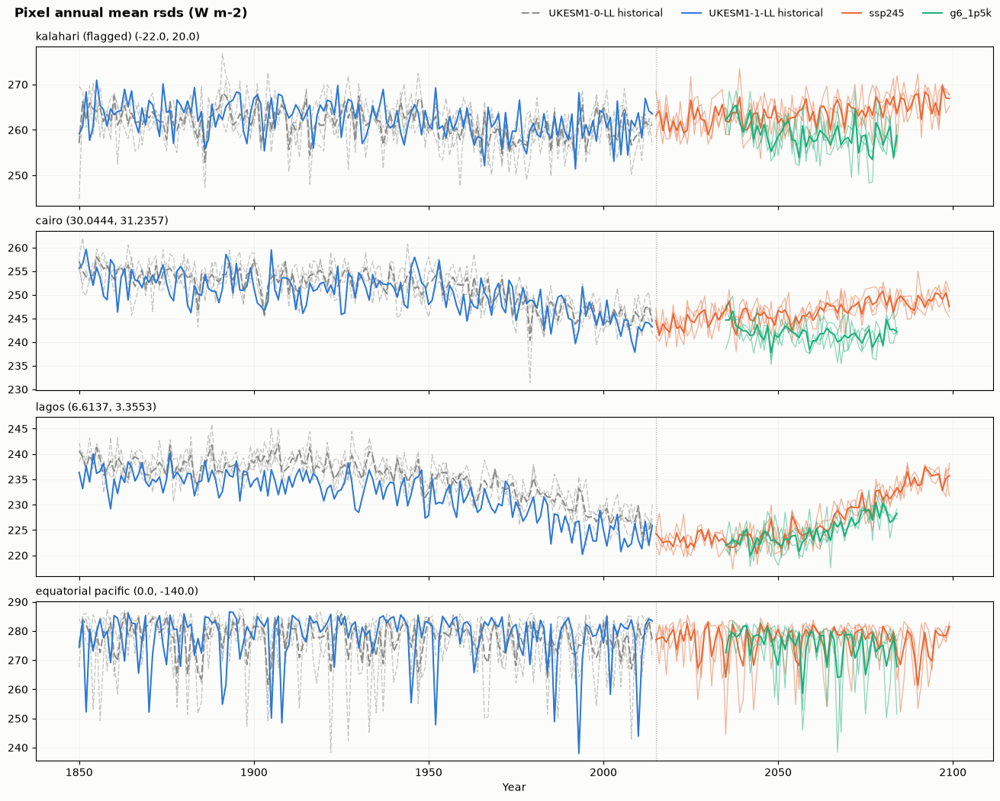

In [9]:
pixel_figs = {}

for var in VARIABLES:
    fig, axes = plt.subplots(
        len(PIXELS),
        1,
        figsize=(13, 2.6 * len(PIXELS)),
        sharex=True,
        constrained_layout=True,
        squeeze=False,
    )
    fig.patch.set_facecolor(SURFACE)
    axes = axes.ravel()
    fig.suptitle(f"Pixel annual mean {var} ({UNITS[var]})", fontweight="bold", x=0.01, ha="left")

    for ax, name in zip(axes, PIXELS):
        ax.set_facecolor(SURFACE)
        for label in runs:
            plot_series(ax, pixels[label][name][var], label, lw=1.4)
        ax.axvline(2015, color=INK, lw=0.8, ls=":", alpha=0.5, zorder=0)
        ax.grid(alpha=0.18, lw=0.5)
        lat, lon = PIXELS[name]
        ax.set_title(f"{name} ({lat}, {lon})", loc="left", fontsize=10)

    axes[-1].set_xlabel("Year")
    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(
        handles, labels, frameon=False, ncols=len(labels), loc="outside upper right", fontsize=9
    )
    pixel_figs[var] = (fig, axes)

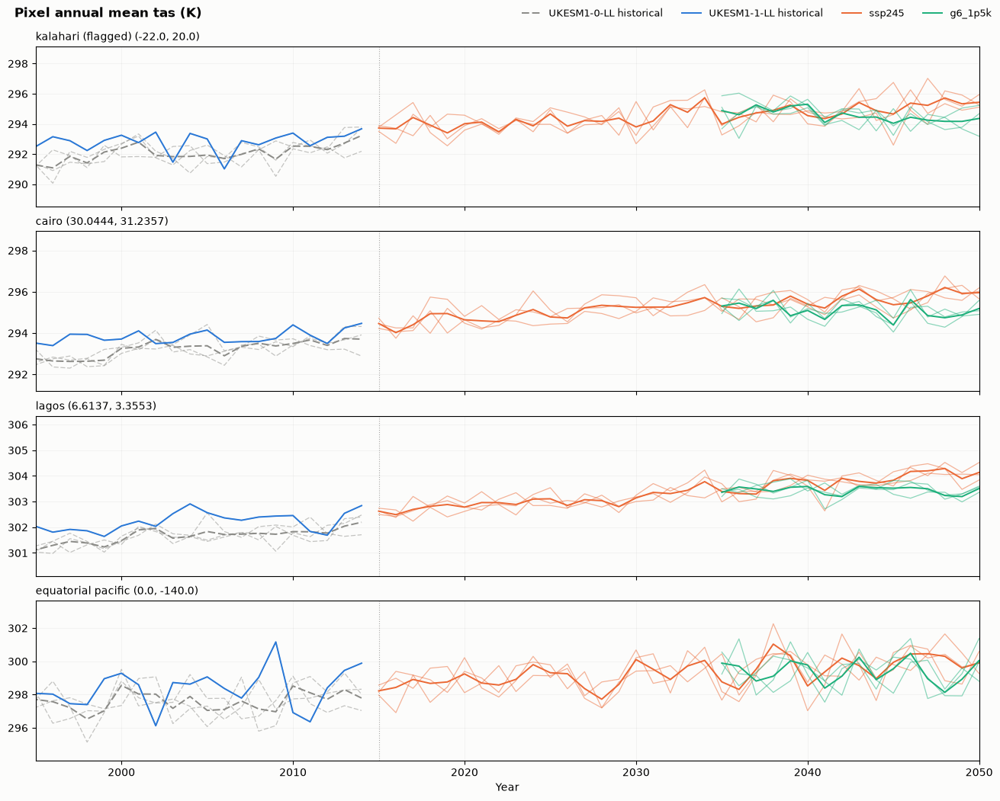

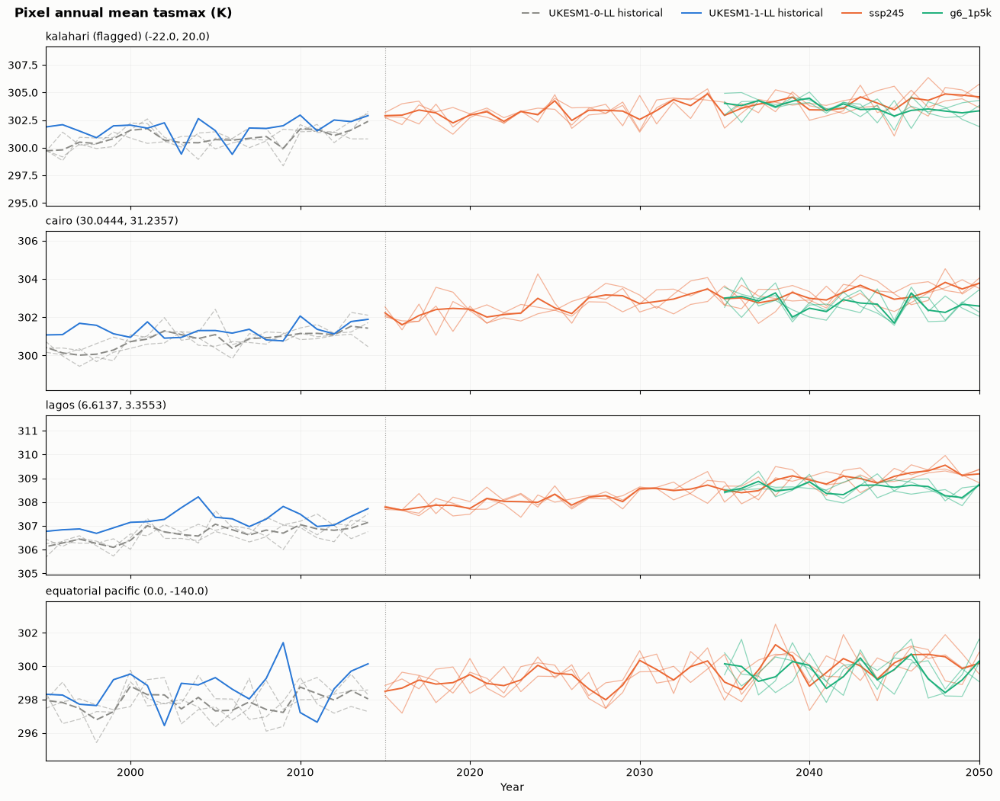

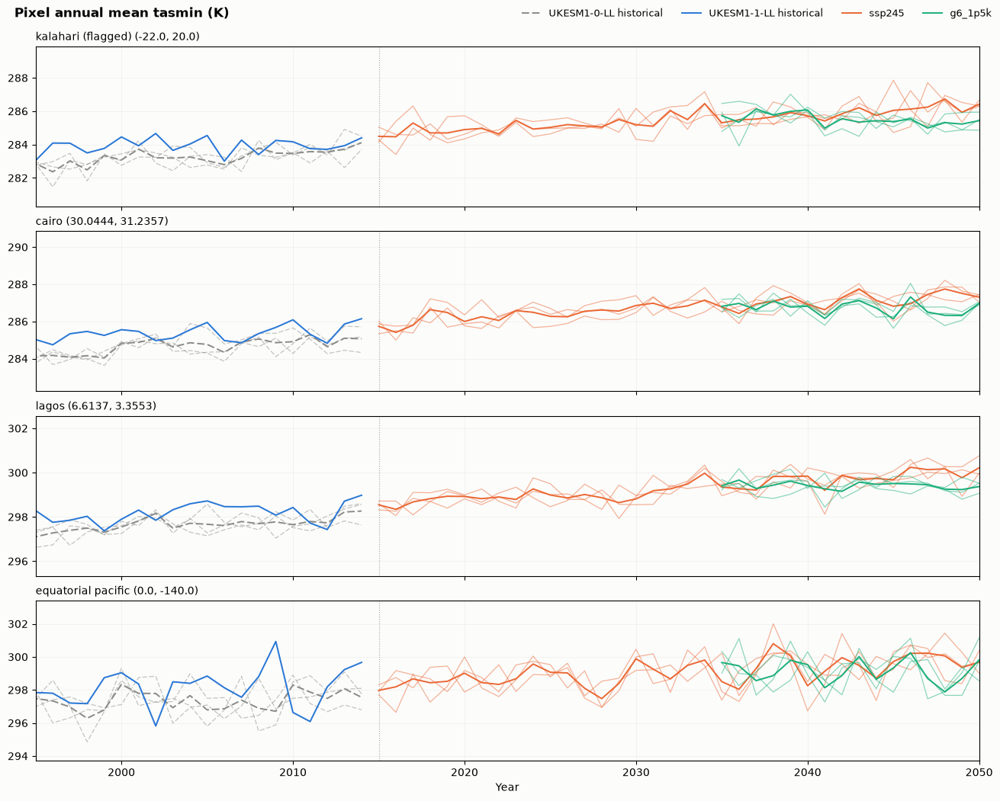

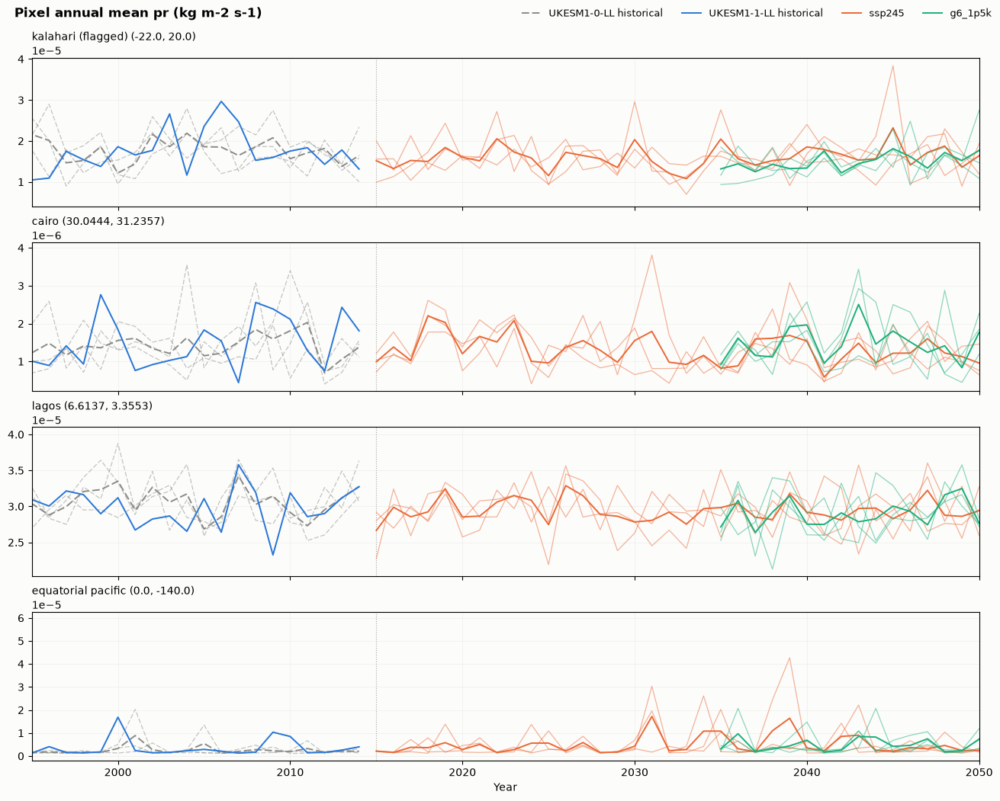

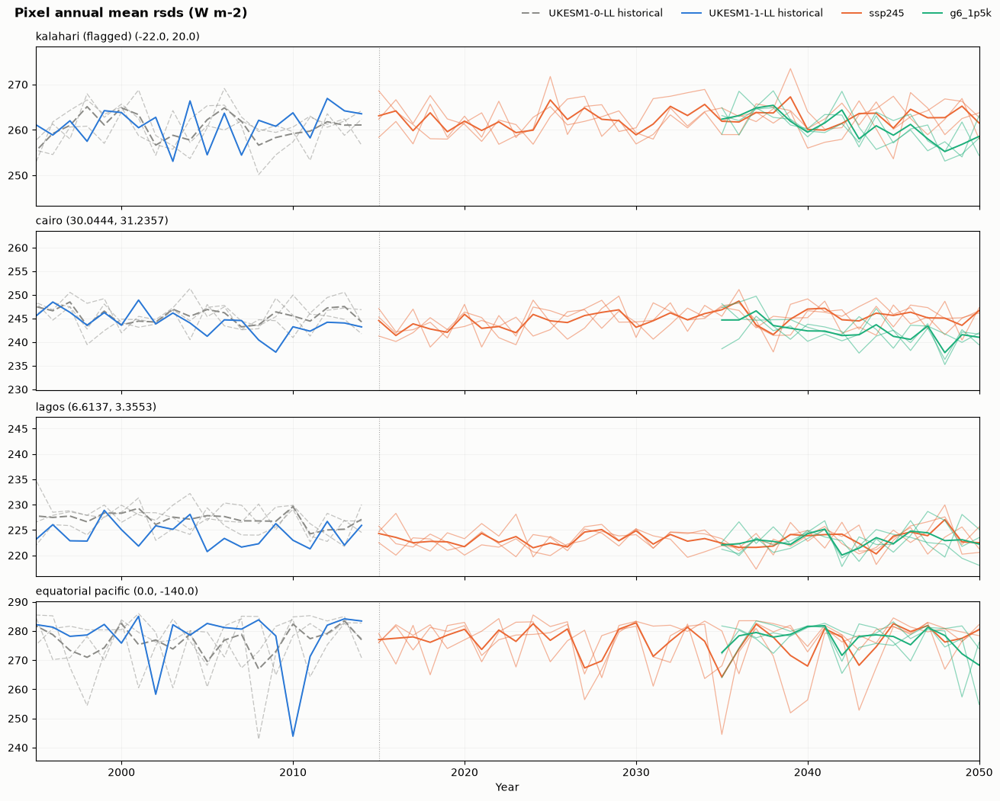

In [10]:
for fig, axes in pixel_figs.values():
    axes[0].set_xlim(1995, 2050)
    display(fig)

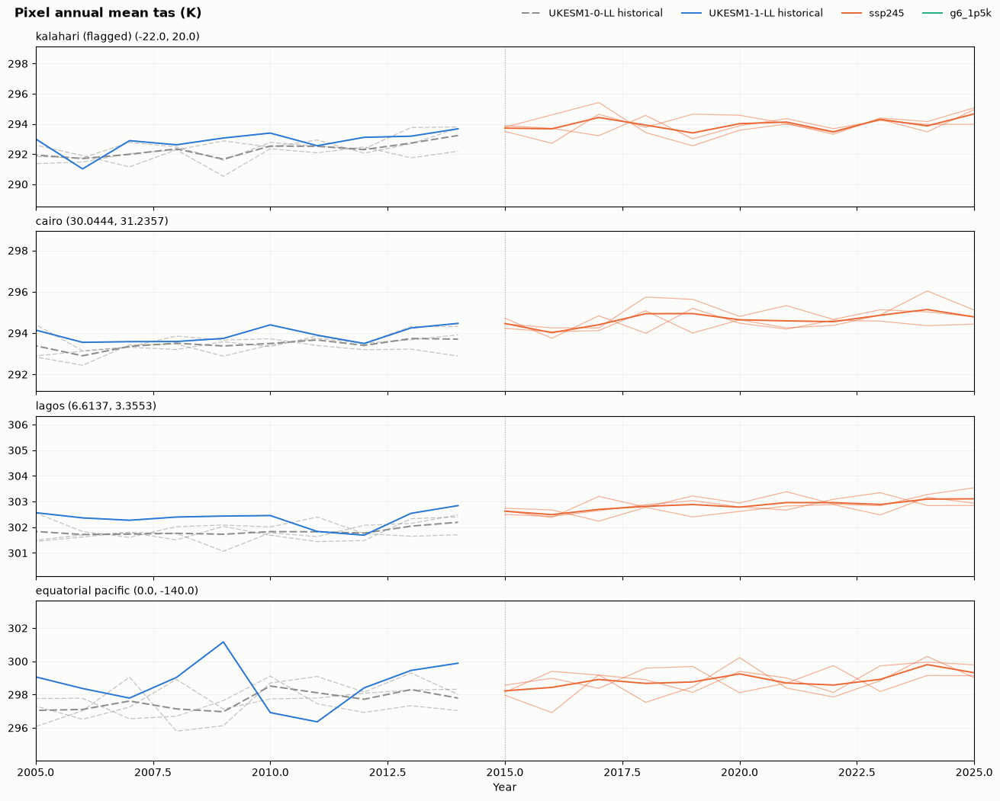

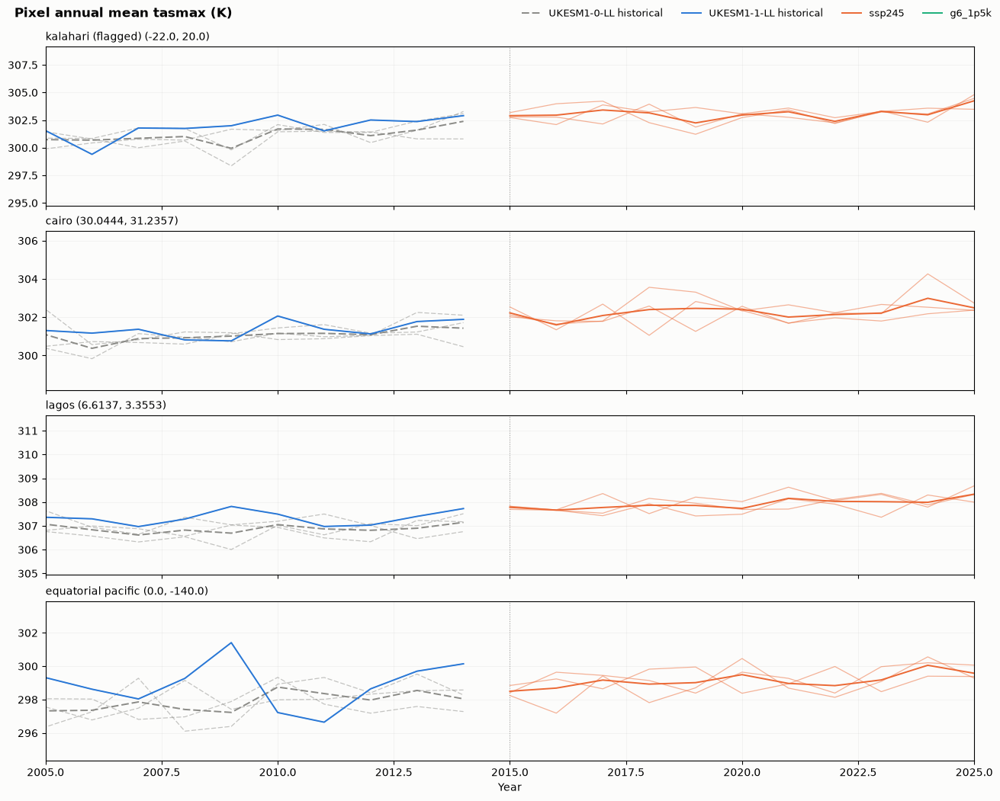

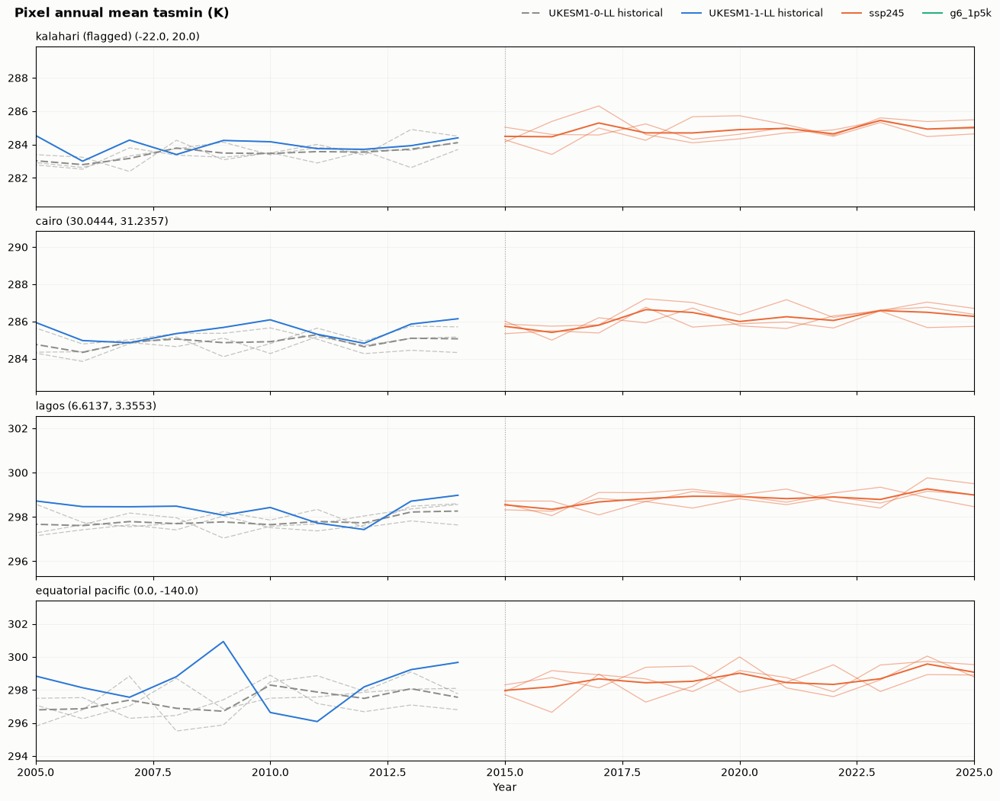

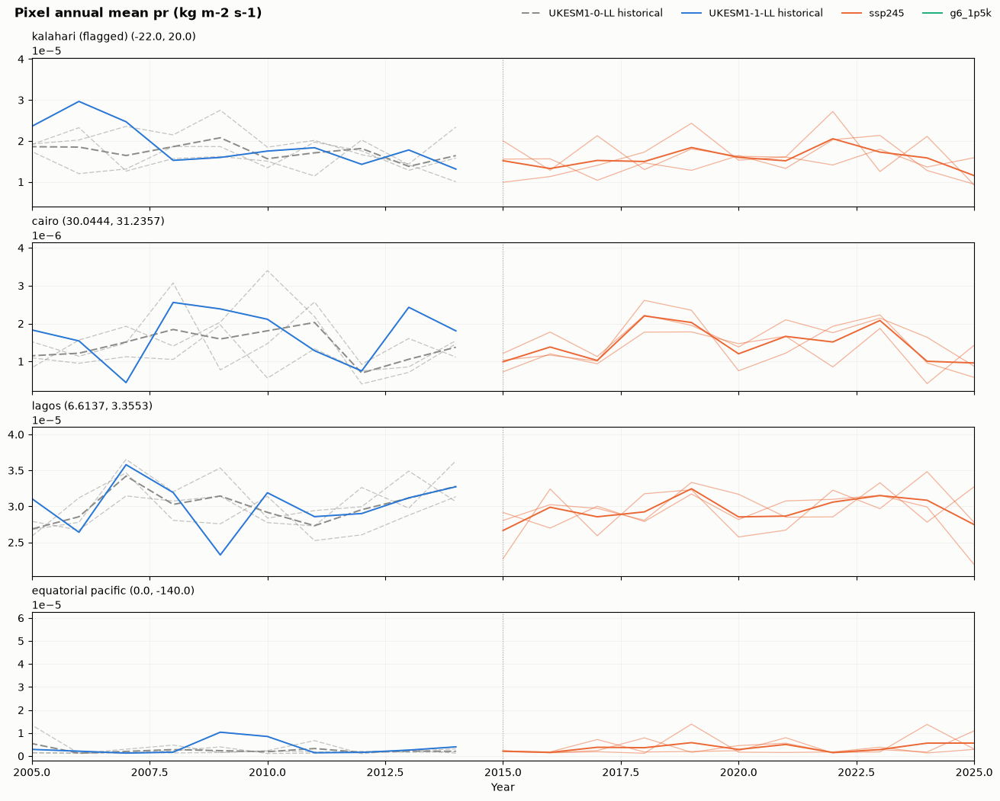

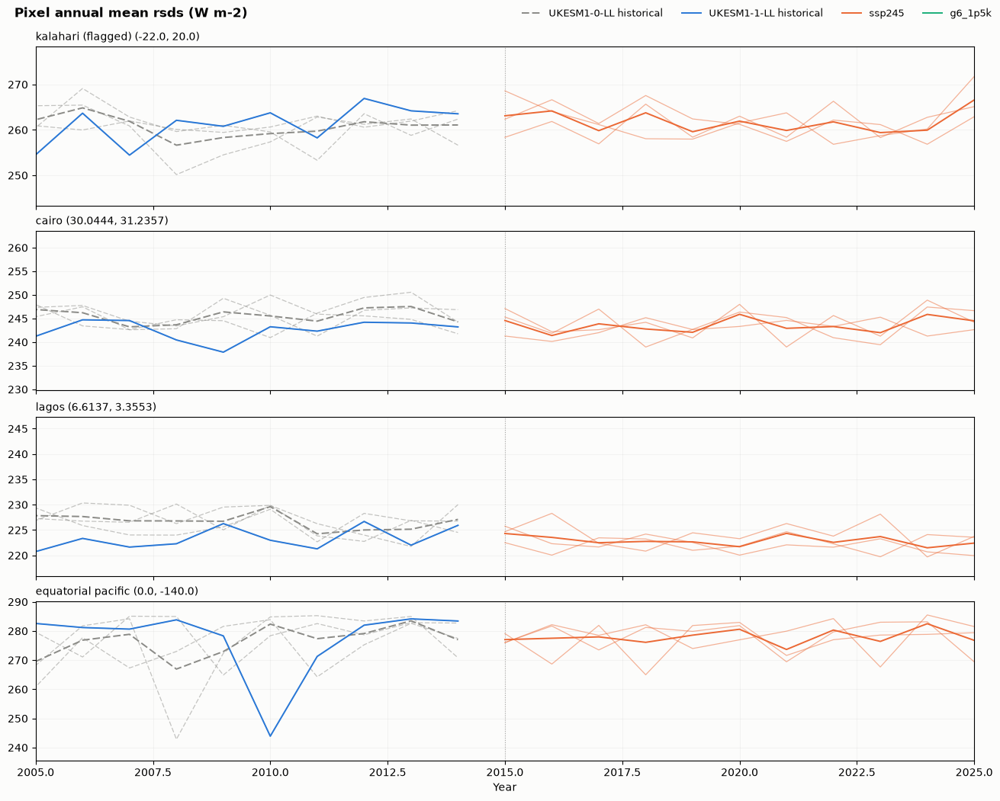

In [11]:
for fig, axes in pixel_figs.values():
    axes[0].set_xlim(2005, 2025)
    display(fig)

## 3. Map of time-mean 1995-2014 against SSP 2015-2034
"map of time-mean 1995-2014 against ssp 2015-2034 (twenty year windows unorthodox for climatalogical periods, but helps to isolate CC from the equation)"

`ssp245` minus either historical still carries twenty years of forced warming, so on its own
neither difference is a discontinuity. It is the comparison *between* the two that isolates one,
which is why both are drawn below on a shared scale.


In [12]:
HIST_WINDOW = slice("1995", "2014")
SSP_WINDOW = slice("2015", "2034")

WINDOWS = {
    "UKESM1-1-LL historical": HIST_WINDOW,
    "UKESM1-0-LL historical": HIST_WINDOW,
    "ssp245": SSP_WINDOW,
}


def window_mean(ds: xr.Dataset, window: slice, var: str) -> xr.DataArray:
    da = ds[var].sel(time=window).mean("time")
    if "ensemble_member" in da.dims:
        da = da.mean("ensemble_member")
    return da.compute()


maps = {
    var: {
        label: window_mean(ds, WINDOWS[label], var)
        for label, ds in runs.items()
        if label in WINDOWS
    }
    for var in VARIABLES
}

In [13]:
DIFF_PAIRS = [
    ("UKESM1-0-LL historical", "UKESM1-1-LL historical"),
    ("ssp245", "UKESM1-1-LL historical"),
    ("ssp245", "UKESM1-0-LL historical"),
]

diffs = {
    var: {(a, b): fields[a].interp_like(fields[b]) - fields[b] for a, b in DIFF_PAIRS}
    for var, fields in maps.items()
}

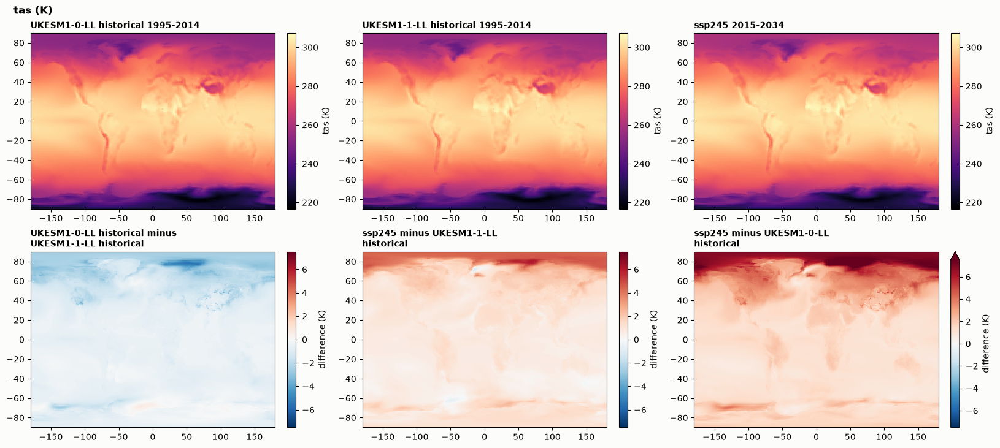

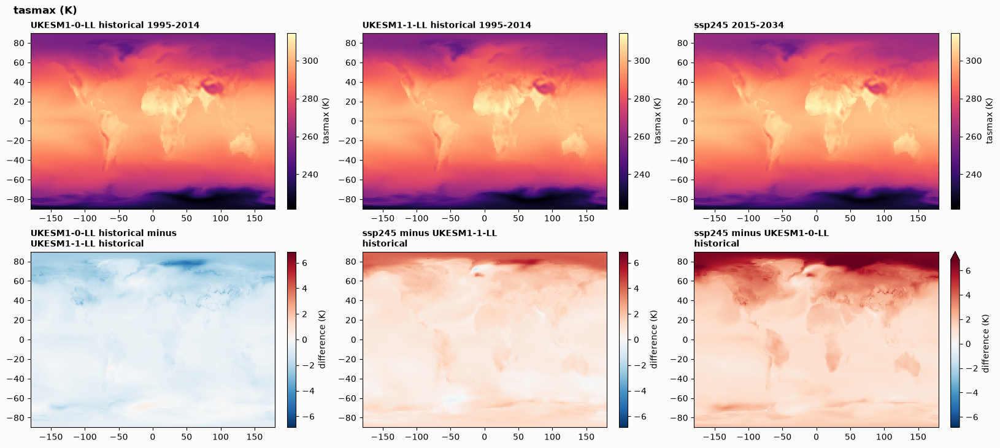

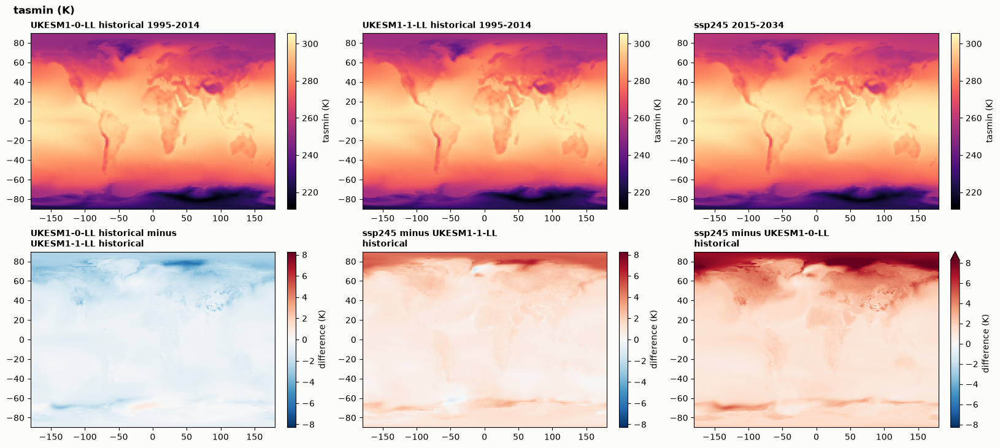

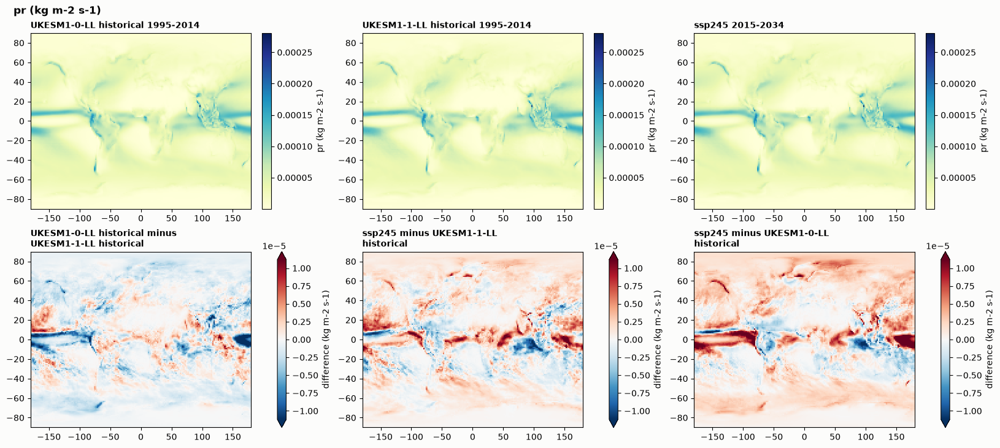

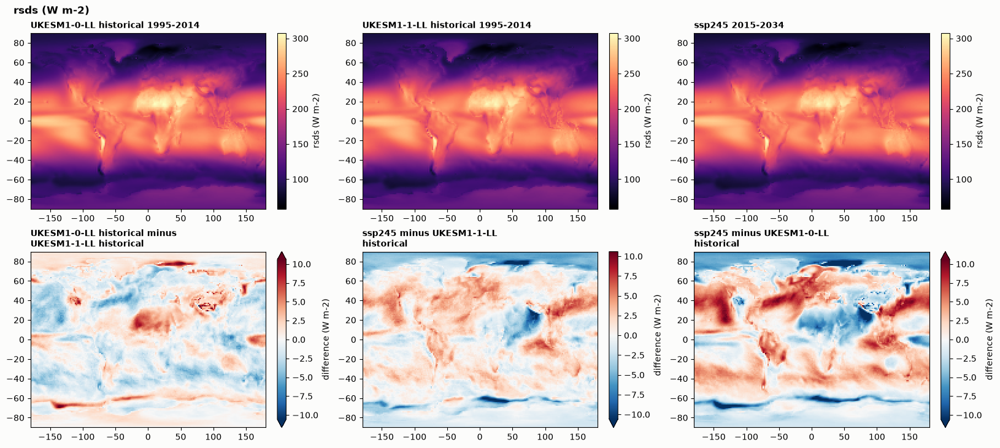

In [14]:
ncols = 3

ABS_CMAP = {
    "tas": "magma",
    "tasmax": "magma",
    "tasmin": "magma",
    "pr": "YlGnBu",
    "rsds": "magma",
}


def draw(ax: plt.Axes, field: xr.DataArray, title: str, **kw) -> None:
    field.plot(ax=ax, **kw)
    ax.set_title(textwrap.fill(title, 34), loc="left", fontweight="bold", fontsize=10)
    ax.set_xlabel("")
    ax.set_ylabel("")


for var in VARIABLES:
    fields = maps[var]
    vmin = min(float(f.min()) for f in fields.values())
    vmax = max(float(f.max()) for f in fields.values())
    lim = max(float(abs(d).quantile(0.99)) for d in diffs[var].values())

    panels = [
        (f"{label}\n{WINDOWS[label].start}-{WINDOWS[label].stop}", field, None)
        for label, field in fields.items()
    ]
    panels += [(f"{a}\nminus {b}", field, "diff") for (a, b), field in diffs[var].items()]

    nrows = -(-len(panels) // ncols)
    fig, axes = plt.subplots(
        nrows, ncols, figsize=(5.4 * ncols, 3.6 * nrows), constrained_layout=True, squeeze=False
    )
    fig.patch.set_facecolor(SURFACE)
    fig.suptitle(f"{var} ({UNITS[var]})", fontweight="bold", x=0.01, ha="left")
    flat = axes.ravel()

    for ax, (title, field, kind) in zip(flat, panels):
        if kind == "diff":
            draw(
                ax,
                field,
                title,
                cmap="RdBu_r",
                vmin=-lim,
                vmax=lim,
                cbar_kwargs={"label": f"difference ({UNITS[var]})"},
            )
        else:
            draw(
                ax,
                field,
                title,
                cmap=ABS_CMAP[var],
                vmin=vmin,
                vmax=vmax,
                cbar_kwargs={"label": f"{var} ({UNITS[var]})"},
            )

    for ax in flat[len(panels) :]:
        ax.set_visible(False)

## 3b. Year-boundary snapshot: 2014 (historical) vs 2015 (ssp245)
"map last year of historical, first year of ssp245, and the delta between them"



In [15]:
YEAR_WINDOWS = {
    "UKESM1-1-LL historical": slice("2014", "2014"),
    "ssp245": slice("2015", "2015"),
}

year_maps = {
    var: {
        label: window_mean(ds, YEAR_WINDOWS[label], var)
        for label, ds in runs.items()
        if label in YEAR_WINDOWS
    }
    for var in VARIABLES
}

year_diffs = {
    var: (
        year_maps[var]["ssp245"].interp_like(year_maps[var]["UKESM1-1-LL historical"])
        - year_maps[var]["UKESM1-1-LL historical"]
    )
    for var in VARIABLES
}

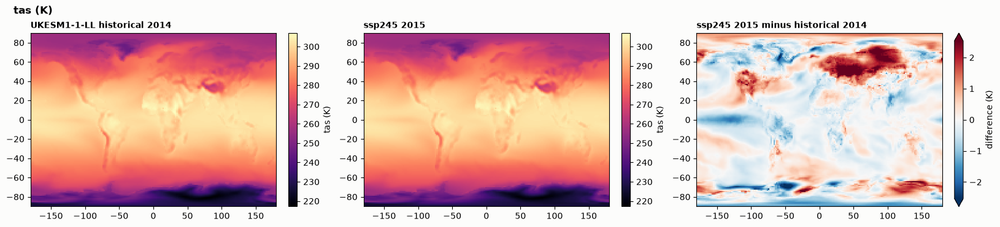

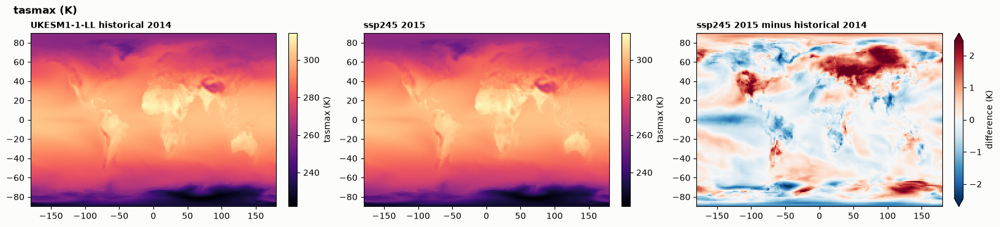

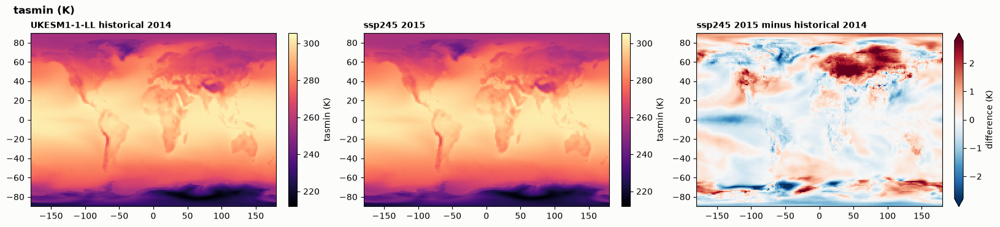

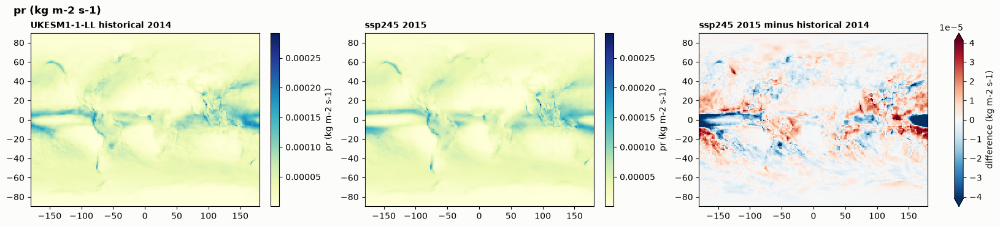

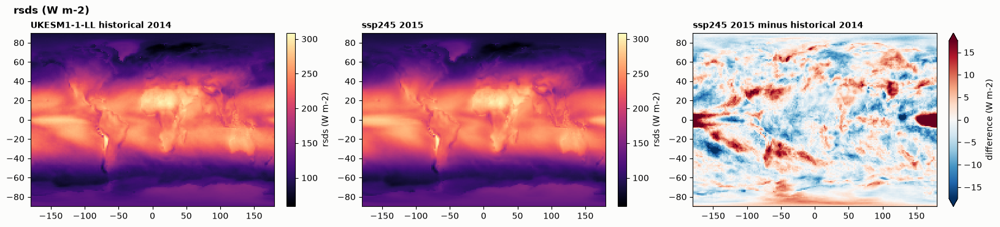

In [16]:
for var in VARIABLES:
    hist_field = year_maps[var]["UKESM1-1-LL historical"]
    ssp_field = year_maps[var]["ssp245"]
    diff_field = year_diffs[var]

    vmin = min(float(hist_field.min()), float(ssp_field.min()))
    vmax = max(float(hist_field.max()), float(ssp_field.max()))
    lim = float(abs(diff_field).quantile(0.99))

    fig, axes = plt.subplots(1, 3, figsize=(5.4 * 3, 3.6), constrained_layout=True)
    fig.patch.set_facecolor(SURFACE)
    fig.suptitle(f"{var} ({UNITS[var]})", fontweight="bold", x=0.01, ha="left")

    draw(
        axes[0],
        hist_field,
        "UKESM1-1-LL historical\n2014",
        cmap=ABS_CMAP[var],
        vmin=vmin,
        vmax=vmax,
        cbar_kwargs={"label": f"{var} ({UNITS[var]})"},
    )
    draw(
        axes[1],
        ssp_field,
        "ssp245\n2015",
        cmap=ABS_CMAP[var],
        vmin=vmin,
        vmax=vmax,
        cbar_kwargs={"label": f"{var} ({UNITS[var]})"},
    )
    draw(
        axes[2],
        diff_field,
        "ssp245 2015\nminus historical 2014",
        cmap="RdBu_r",
        vmin=-lim,
        vmax=lim,
        cbar_kwargs={"label": f"difference ({UNITS[var]})"},
    )

In [17]:
cluster.shutdown()

[21:23:07] INFO     Cluster 2003650 deleted successfully.